## Attribute: Gage Height
####  Dataset duration 3 year 15 min (Converted to 1 hour interval for model train and test)
####  Outliers removed

## Models: GRU, BiLSTM, LSTM
#### Early Stopping Callbacks removed (50 epoch is used for all for model comparison)
#### Prediction = Red, Real data = Blue 

## MAPE, r2 score and train/test plot added

In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
from datetime import datetime
import matplotlib.pyplot as plt 
import os
import plotly.graph_objects as go
import plotly.express as px

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, layers, callbacks
from tensorflow.keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional

2023-04-04 14:48:55.617365: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
water_data = pd.read_csv('Gage_height.csv')
water_data

,datetime,data,value
0,2/1/20 0:00,18.77,A
1,2/1/20 0:15,18.77,A
2,2/1/20 0:30,18.78,A
3,2/1/20 0:45,18.81,A
4,2/1/20 1:00,18.81,A
...,...,...,...
105272,2/3/23 22:45,19.05,P
105273,2/3/23 23:00,19.05,P
105274,2/3/23 23:15,19.05,P
105275,2/3/23 23:30,19.04,P


In [3]:
water_data['timestamp'] = pd.to_datetime(water_data['datetime'])
water_data['gage_height'] = water_data['data']
water_data['data_qualification_code'] = water_data['value']

In [4]:
water_data

,datetime,data,value,timestamp,gage_height,data_qualification_code
0,2/1/20 0:00,18.77,A,2020-02-01 00:00:00,18.77,A
1,2/1/20 0:15,18.77,A,2020-02-01 00:15:00,18.77,A
2,2/1/20 0:30,18.78,A,2020-02-01 00:30:00,18.78,A
3,2/1/20 0:45,18.81,A,2020-02-01 00:45:00,18.81,A
4,2/1/20 1:00,18.81,A,2020-02-01 01:00:00,18.81,A
...,...,...,...,...,...,...
105272,2/3/23 22:45,19.05,P,2023-02-03 22:45:00,19.05,P
105273,2/3/23 23:00,19.05,P,2023-02-03 23:00:00,19.05,P
105274,2/3/23 23:15,19.05,P,2023-02-03 23:15:00,19.05,P
105275,2/3/23 23:30,19.04,P,2023-02-03 23:30:00,19.04,P


In [5]:
# drop unnecessary colums
water_data =water_data.drop(['datetime','value','data','data_qualification_code'], axis=1)
water_data

,timestamp,gage_height
0,2020-02-01 00:00:00,18.77
1,2020-02-01 00:15:00,18.77
2,2020-02-01 00:30:00,18.78
3,2020-02-01 00:45:00,18.81
4,2020-02-01 01:00:00,18.81
...,...,...
105272,2023-02-03 22:45:00,19.05
105273,2023-02-03 23:00:00,19.05
105274,2023-02-03 23:15:00,19.05
105275,2023-02-03 23:30:00,19.04


In [6]:
fig = px.line(water_data.reset_index(), x = 'timestamp', y = 'gage_height')
fig.update_xaxes(rangeslider_visible = True)
fig.show()

In [7]:
from sklearn.ensemble import IsolationForest
model = IsolationForest()
model.fit(water_data[['gage_height']])

IsolationForest()

In [8]:
score = model.decision_function(water_data[['gage_height']])
score

array([0.06441593, 0.06441593, 0.06195429, ..., 0.04947884, 0.05122274,
       0.04233319])

(array([6.3000e+01, 4.3000e+01, 2.9000e+01, 2.3600e+02, 3.6000e+01,
        9.0000e+00, 2.6000e+01, 1.6000e+01, 4.1000e+01, 3.2000e+01,
        3.6000e+01, 8.7000e+01, 1.6000e+01, 2.8000e+01, 6.2000e+01,
        1.4700e+02, 6.6000e+01, 1.0000e+02, 3.1000e+01, 8.1000e+01,
        3.6000e+01, 7.1000e+01, 2.4000e+01, 1.0000e+02, 9.9000e+01,
        1.1000e+01, 1.0500e+02, 7.5000e+01, 5.2000e+01, 1.4000e+02,
        6.8000e+01, 9.6000e+01, 2.0700e+02, 2.5700e+02, 1.2300e+02,
        9.0000e+01, 2.8800e+02, 8.7000e+01, 1.0500e+02, 8.3000e+01,
        1.7500e+02, 9.5000e+01, 2.7500e+02, 9.0000e+01, 2.5900e+02,
        6.5400e+02, 1.9400e+02, 5.7600e+02, 3.9100e+02, 1.0000e+02,
        1.5700e+02, 6.2000e+02, 1.5600e+02, 5.7200e+02, 1.4800e+02,
        3.9300e+02, 1.3200e+02, 5.7300e+02, 4.1100e+02, 2.7600e+02,
        9.2000e+01, 9.0000e+01, 2.8000e+01, 4.6200e+02, 4.1000e+01,
        2.8200e+02, 7.0200e+02, 1.2710e+03, 5.5400e+02, 2.9500e+02,
        1.8500e+03, 1.4880e+03, 5.4000e+02, 7.16

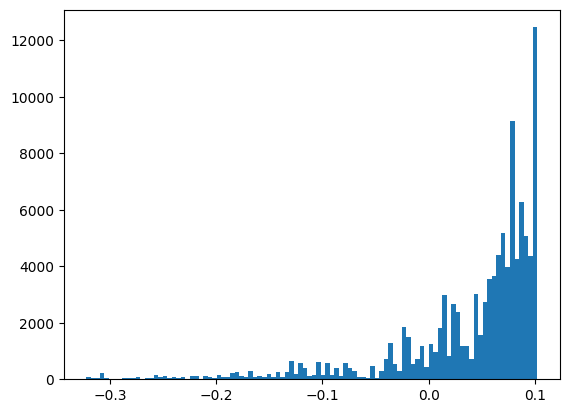

In [9]:
# plot score histogram to find the outliers
import matplotlib.pyplot as plt
plt.hist(score, bins = 100)

In [10]:
water_data['score'] = score

In [11]:
water_data

,timestamp,gage_height,score
0,2020-02-01 00:00:00,18.77,0.064416
1,2020-02-01 00:15:00,18.77,0.064416
2,2020-02-01 00:30:00,18.78,0.061954
3,2020-02-01 00:45:00,18.81,0.058891
4,2020-02-01 01:00:00,18.81,0.058891
...,...,...,...
105272,2023-02-03 22:45:00,19.05,0.049479
105273,2023-02-03 23:00:00,19.05,0.049479
105274,2023-02-03 23:15:00,19.05,0.049479
105275,2023-02-03 23:30:00,19.04,0.051223


In [12]:
water_data.query('score <-0.12')

,timestamp,gage_height,score
561,2020-02-06 20:30:00,22.77,-0.123499
562,2020-02-06 20:45:00,22.96,-0.127011
563,2020-02-06 21:00:00,23.15,-0.129473
564,2020-02-06 21:15:00,23.33,-0.131018
565,2020-02-06 21:30:00,23.49,-0.135502
...,...,...,...
95597,2022-10-26 05:00:00,17.77,-0.129069
95598,2022-10-26 05:15:00,17.76,-0.130774
95909,2022-10-29 11:00:00,17.70,-0.139615
96114,2022-10-31 14:15:00,17.77,-0.129069


In [13]:
new_water_data= water_data
new_water_data

,timestamp,gage_height,score
0,2020-02-01 00:00:00,18.77,0.064416
1,2020-02-01 00:15:00,18.77,0.064416
2,2020-02-01 00:30:00,18.78,0.061954
3,2020-02-01 00:45:00,18.81,0.058891
4,2020-02-01 01:00:00,18.81,0.058891
...,...,...,...
105272,2023-02-03 22:45:00,19.05,0.049479
105273,2023-02-03 23:00:00,19.05,0.049479
105274,2023-02-03 23:15:00,19.05,0.049479
105275,2023-02-03 23:30:00,19.04,0.051223


In [14]:
# removing outliers 
new_water_data.drop((new_water_data.query('score <-0.12')).index, inplace = True)
new_water_data

,timestamp,gage_height,score
0,2020-02-01 00:00:00,18.77,0.064416
1,2020-02-01 00:15:00,18.77,0.064416
2,2020-02-01 00:30:00,18.78,0.061954
3,2020-02-01 00:45:00,18.81,0.058891
4,2020-02-01 01:00:00,18.81,0.058891
...,...,...,...
105272,2023-02-03 22:45:00,19.05,0.049479
105273,2023-02-03 23:00:00,19.05,0.049479
105274,2023-02-03 23:15:00,19.05,0.049479
105275,2023-02-03 23:30:00,19.04,0.051223


In [15]:
# droping the unnecessary score column
new_water_data =new_water_data.drop(['score'], axis=1)
new_water_data

,timestamp,gage_height
0,2020-02-01 00:00:00,18.77
1,2020-02-01 00:15:00,18.77
2,2020-02-01 00:30:00,18.78
3,2020-02-01 00:45:00,18.81
4,2020-02-01 01:00:00,18.81
...,...,...
105272,2023-02-03 22:45:00,19.05
105273,2023-02-03 23:00:00,19.05
105274,2023-02-03 23:15:00,19.05
105275,2023-02-03 23:30:00,19.04


<Axes: >

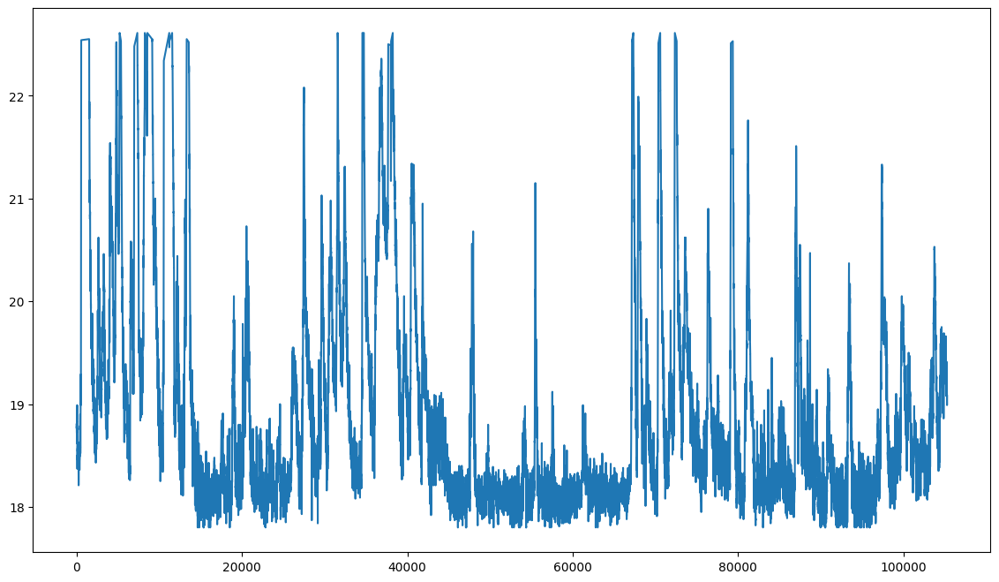

In [16]:
new_water_data['gage_height'].plot(figsize=(14,8))

In [17]:
# Set the DATE column as the index.
new_water_data = new_water_data.set_index('timestamp')
new_water_data.head()

,gage_height
timestamp,
2020-02-01 00:00:00,18.77
2020-02-01 00:15:00,18.77
2020-02-01 00:30:00,18.78
2020-02-01 00:45:00,18.81
2020-02-01 01:00:00,18.81


In [18]:
new_water_data.index

DatetimeIndex(['2020-02-01 00:00:00', '2020-02-01 00:15:00',
               '2020-02-01 00:30:00', '2020-02-01 00:45:00',
               '2020-02-01 01:00:00', '2020-02-01 01:15:00',
               '2020-02-01 01:30:00', '2020-02-01 01:45:00',
               '2020-02-01 02:00:00', '2020-02-01 02:15:00',
               ...
               '2023-02-03 21:30:00', '2023-02-03 21:45:00',
               '2023-02-03 22:00:00', '2023-02-03 22:15:00',
               '2023-02-03 22:30:00', '2023-02-03 22:45:00',
               '2023-02-03 23:00:00', '2023-02-03 23:15:00',
               '2023-02-03 23:30:00', '2023-02-03 23:45:00'],
              dtype='datetime64[ns]', name='timestamp', length=99859, freq=None)

In [19]:
new_water_data

,gage_height
timestamp,
2020-02-01 00:00:00,18.77
2020-02-01 00:15:00,18.77
2020-02-01 00:30:00,18.78
2020-02-01 00:45:00,18.81
2020-02-01 01:00:00,18.81
...,...
2023-02-03 22:45:00,19.05
2023-02-03 23:00:00,19.05
2023-02-03 23:15:00,19.05


In [20]:
# finding duplicate
# new_water_data[new_water_data.index.duplicated()]
new_water_data.index.duplicated()

array([False, False, False, ..., False, False, False])

In [21]:
# Drop rows with duplicate index values
final_water_data = new_water_data.loc[~new_water_data.index.duplicated(), :]
final_water_data

,gage_height
timestamp,
2020-02-01 00:00:00,18.77
2020-02-01 00:15:00,18.77
2020-02-01 00:30:00,18.78
2020-02-01 00:45:00,18.81
2020-02-01 01:00:00,18.81
...,...
2023-02-03 22:45:00,19.05
2023-02-03 23:00:00,19.05
2023-02-03 23:15:00,19.05


In [22]:
# Missing time series row
dt = pd.Series(data = pd.date_range(start=final_water_data.index.min(), end=final_water_data.index.max(), freq = '15Min'))
idx = pd. DatetimeIndex(dt)
final_water_data2 = final_water_data.reindex(idx)

In [23]:
final_water_data2

,gage_height
2020-02-01 00:00:00,18.77
2020-02-01 00:15:00,18.77
2020-02-01 00:30:00,18.78
2020-02-01 00:45:00,18.81
2020-02-01 01:00:00,18.81
...,...
2023-02-03 22:45:00,19.05
2023-02-03 23:00:00,19.05
2023-02-03 23:15:00,19.05
2023-02-03 23:30:00,19.04


In [24]:
final_water_data3 = final_water_data2.interpolate(method = 'time')

In [25]:
final_water_data3

,gage_height
2020-02-01 00:00:00,18.77
2020-02-01 00:15:00,18.77
2020-02-01 00:30:00,18.78
2020-02-01 00:45:00,18.81
2020-02-01 01:00:00,18.81
...,...
2023-02-03 22:45:00,19.05
2023-02-03 23:00:00,19.05
2023-02-03 23:15:00,19.05
2023-02-03 23:30:00,19.04


<Axes: >

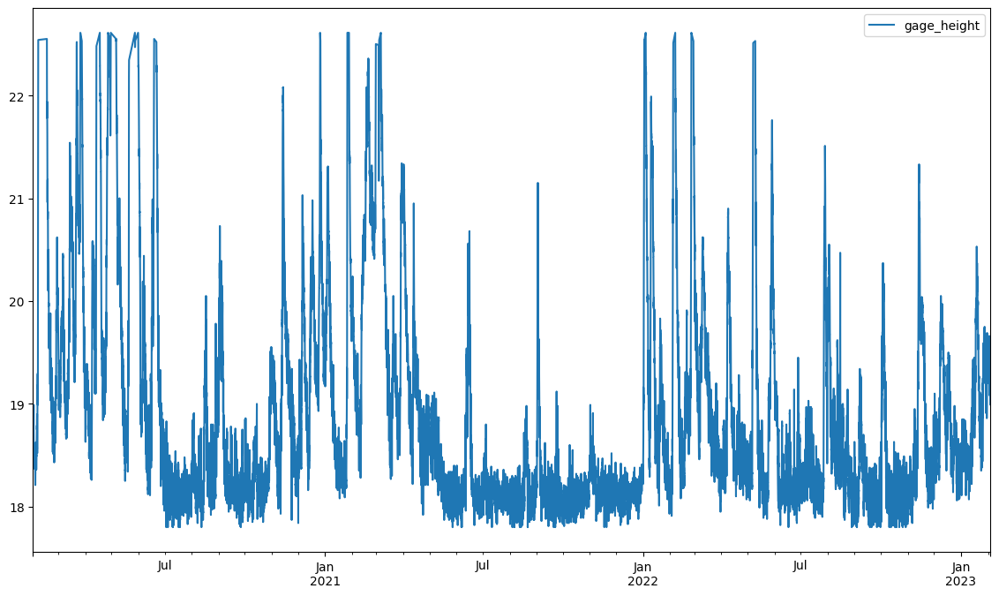

In [26]:
final_water_data3.plot(figsize=(14,8))

In [27]:
df = final_water_data3
df.head()

,gage_height
2020-02-01 00:00:00,18.77
2020-02-01 00:15:00,18.77
2020-02-01 00:30:00,18.78
2020-02-01 00:45:00,18.81
2020-02-01 01:00:00,18.81


In [28]:
df.columns = ['Value']
df

,Value
2020-02-01 00:00:00,18.77
2020-02-01 00:15:00,18.77
2020-02-01 00:30:00,18.78
2020-02-01 00:45:00,18.81
2020-02-01 01:00:00,18.81
...,...
2023-02-03 22:45:00,19.05
2023-02-03 23:00:00,19.05
2023-02-03 23:15:00,19.05
2023-02-03 23:30:00,19.04


In [29]:
#Verify that there are no empty cells in any column. The output should be all zeroes.
import numpy as np
df.isin([np.nan, np.inf, -np.inf]).sum()

Value    0
dtype: int64

In [30]:
# 15 min---->> Hourly
df = df.resample(rule='H').mean()

In [31]:
df

,Value
2020-02-01 00:00:00,18.7825
2020-02-01 01:00:00,18.8050
2020-02-01 02:00:00,18.7875
2020-02-01 03:00:00,18.7600
2020-02-01 04:00:00,18.7375
...,...
2023-02-03 19:00:00,19.1625
2023-02-03 20:00:00,19.1250
2023-02-03 21:00:00,19.0650
2023-02-03 22:00:00,19.0300


<Axes: >

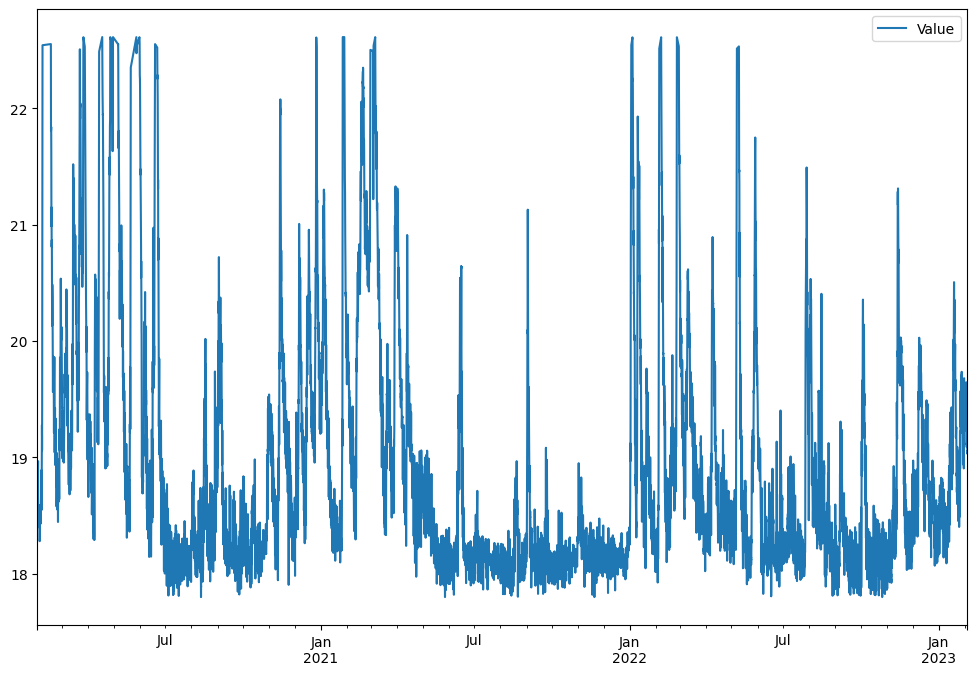

In [32]:
# Plot out the time series
df.plot(figsize=(12,8))

In [33]:
data_count_15min_interval = len(final_water_data3)
print(data_count_15min_interval)
data_count_1hr_interval=len(df)
print(data_count_1hr_interval)

105504
26376


In [34]:
train_size = int(0.8*data_count_1hr_interval)
print(train_size)
test_size = data_count_1hr_interval-train_size
print(test_size)

21100
5276


In [35]:
dataset = df
dataset

,Value
2020-02-01 00:00:00,18.7825
2020-02-01 01:00:00,18.8050
2020-02-01 02:00:00,18.7875
2020-02-01 03:00:00,18.7600
2020-02-01 04:00:00,18.7375
...,...
2023-02-03 19:00:00,19.1625
2023-02-03 20:00:00,19.1250
2023-02-03 21:00:00,19.0650
2023-02-03 22:00:00,19.0300


In [36]:
training_set = df.iloc[:train_size, 0:1].values
training_set

array([[18.7825],
       [18.805 ],
       [18.7875],
       ...,
       [18.265 ],
       [18.2875],
       [18.2875]])

In [37]:
len(training_set)

21100

In [38]:
testing_set = df.iloc[train_size:, 0:1].values
testing_set.shape

(5276, 1)

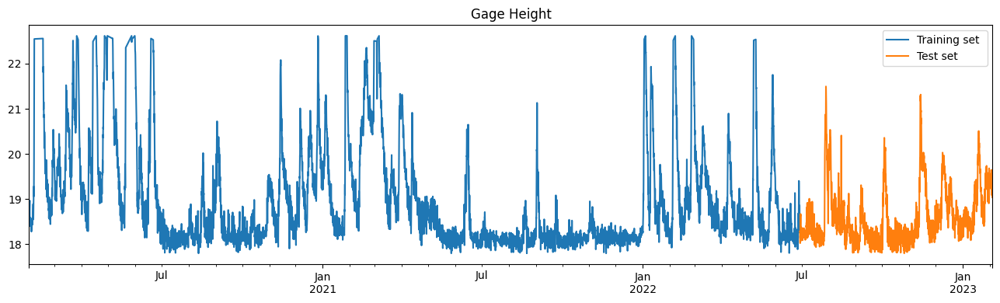

In [39]:
df['Value'][:train_size].plot(figsize=(16,4),legend=True)
df['Value'][train_size:].plot(figsize=(16,4),legend=True)
plt.legend(['Training set ','Test set'])
plt.title('Gage Height')
plt.show()

In [40]:
# Feature scaling to optimize the training set
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(training_set)

In [41]:
# Create a data structure with 1 timesteps and 1 output
# Format it into a three-dimensional array for use in our LSTM model
X_train = []
y_train = []
for i in range(1, train_size):
    X_train.append(training_set_scaled[i-1:i, 0]) # Appending previous 1 data.
    y_train.append(training_set_scaled[i, 0])

X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping (LSMT Model needs to be 3- dimensional) following format (values, time-steps, 1 dimensional output).
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_train.shape

(21099, 1, 1)

In [42]:
# Create GRU model
def create_gru(units):
    model = Sequential()
    # Input layer
    model.add(GRU (units = units, return_sequences = True, 
    input_shape = [X_train.shape[1], X_train.shape[2]]))
    model.add(Dropout(0.2)) 
    # Hidden layer
    model.add(GRU(units = units)) 
    model.add(Dropout(0.2))
    model.add(Dense(units = 1)) 
    #Compile model
    model.compile(optimizer='adam',loss='mse')
    return model
model_gru = create_gru(64)

2023-04-04 14:51:04.862456: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [43]:
import keras
def fit_model(model):
    
#-----Early stop implementation-----  
#     early_stop = keras.callbacks.EarlyStopping(monitor = 'val_loss',
#                                                patience = 10)
#     history = model.fit(X_train, y_train, epochs = 50,  
#                         validation_split = 0.2,
#                         batch_size = 16, shuffle = False, 
#                         callbacks = [early_stop])
    
# ------ without Early stop ----
    history = model.fit(X_train, y_train, epochs = 50,  
                        validation_split = 0.2,
                        batch_size = 16, shuffle = False 
                        )    
    return history


In [44]:
history_gru = fit_model(model_gru)

Epoch 1/50
1055/1055 [==============================] - 4s 2ms/step - loss: 0.0094 - val_loss: 2.4904e-04
Epoch 2/50
1055/1055 [==============================] - 2s 2ms/step - loss: 0.0015 - val_loss: 4.1702e-04
Epoch 3/50
1055/1055 [==============================] - 2s 2ms/step - loss: 0.0019 - val_loss: 8.2120e-04
Epoch 4/50
1055/1055 [==============================] - 2s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 5/50
1055/1055 [==============================] - 2s 2ms/step - loss: 0.0014 - val_loss: 0.0028
Epoch 6/50
1055/1055 [==============================] - 2s 2ms/step - loss: 0.0019 - val_loss: 0.0013
Epoch 7/50
1055/1055 [==============================] - 2s 2ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 8/50
1055/1055 [==============================] - 2s 2ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 9/50
1055/1055 [==============================] - 2s 2ms/step - loss: 0.0014 - val_loss: 9.0537e-04
Epoch 10/50
1055/1055 [==============================] - 2s 2ms/st

In [45]:
# Create BiLSTM model
def create_bilstm(units):
    model = Sequential()
    # Input layer
    model.add(Bidirectional(
              LSTM(units = units, return_sequences=True), 
              input_shape=(X_train.shape[1], X_train.shape[2])))
    # Hidden layer
    model.add(Bidirectional(LSTM(units = units)))
    model.add(Dense(1))
    #Compile model
    model.compile(optimizer='adam',loss='mse')
    return model
model_bilstm = create_bilstm(64)

In [46]:
history_bilstm = fit_model(model_bilstm)

Epoch 1/50
1055/1055 [==============================] - 6s 3ms/step - loss: 0.0103 - val_loss: 6.4315e-04
Epoch 2/50
1055/1055 [==============================] - 2s 2ms/step - loss: 3.8079e-04 - val_loss: 3.9933e-04
Epoch 3/50
1055/1055 [==============================] - 2s 2ms/step - loss: 3.8164e-04 - val_loss: 2.2443e-04
Epoch 4/50
1055/1055 [==============================] - 2s 2ms/step - loss: 6.2912e-04 - val_loss: 6.6250e-04
Epoch 5/50
1055/1055 [==============================] - 2s 2ms/step - loss: 7.6732e-04 - val_loss: 0.0011
Epoch 6/50
1055/1055 [==============================] - 2s 2ms/step - loss: 8.5609e-04 - val_loss: 0.0010
Epoch 7/50
1055/1055 [==============================] - 2s 2ms/step - loss: 6.0971e-04 - val_loss: 0.0010
Epoch 8/50
1055/1055 [==============================] - 2s 2ms/step - loss: 6.3748e-04 - val_loss: 9.4888e-04
Epoch 9/50
1055/1055 [==============================] - 2s 2ms/step - loss: 5.7843e-04 - val_loss: 8.7703e-04
Epoch 10/50
1055/1055 [===

In [47]:
# creating LSTM model
model_lstm = Sequential()

# Adding first LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100, return_sequences=True, input_shape = (X_train.shape[1], 1)))
model_lstm.add(Dropout(0.1))

# Adding second LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100, return_sequences=True))
model_lstm.add(Dropout(0.1))

# Adding third LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100, return_sequences=True))
model_lstm.add(Dropout(0.1))

# Adding fourth LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100, return_sequences=True))
model_lstm.add(Dropout(0.1))

# Adding fifth LSTM layer and some dropout Dropout regularisation
model_lstm.add(LSTM(units=100))
model_lstm.add(Dropout(0.1))

# Adding the Output Layer
model_lstm.add(Dense(units=1))

# Compiling the model
# Because we're doing regression hence mean_squared_error
model_lstm.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [48]:
history_lstm = fit_model(model_lstm)

Epoch 1/50
1055/1055 [==============================] - 11s 6ms/step - loss: 0.0341 - val_loss: 5.2914e-04
Epoch 2/50
1055/1055 [==============================] - 5s 5ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 3/50
1055/1055 [==============================] - 5s 5ms/step - loss: 0.0026 - val_loss: 5.6306e-04
Epoch 4/50
1055/1055 [==============================] - 5s 5ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 5/50
1055/1055 [==============================] - 5s 5ms/step - loss: 0.0020 - val_loss: 0.0015
Epoch 6/50
1055/1055 [==============================] - 8s 8ms/step - loss: 0.0018 - val_loss: 0.0014
Epoch 7/50
1055/1055 [==============================] - 5s 5ms/step - loss: 0.0066 - val_loss: 5.8985e-04
Epoch 8/50
1055/1055 [==============================] - 5s 5ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 9/50
1055/1055 [==============================] - 5s 5ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 10/50
1055/1055 [==============================] - 5s 5ms/step 

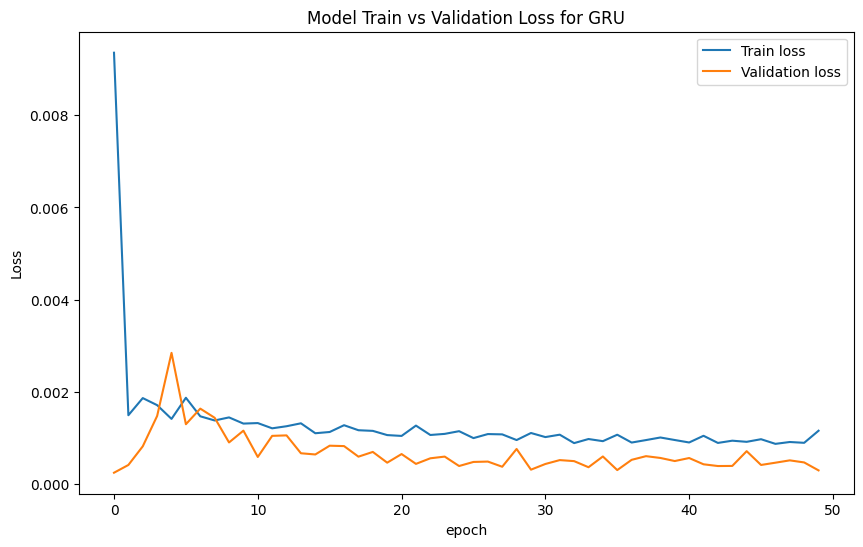

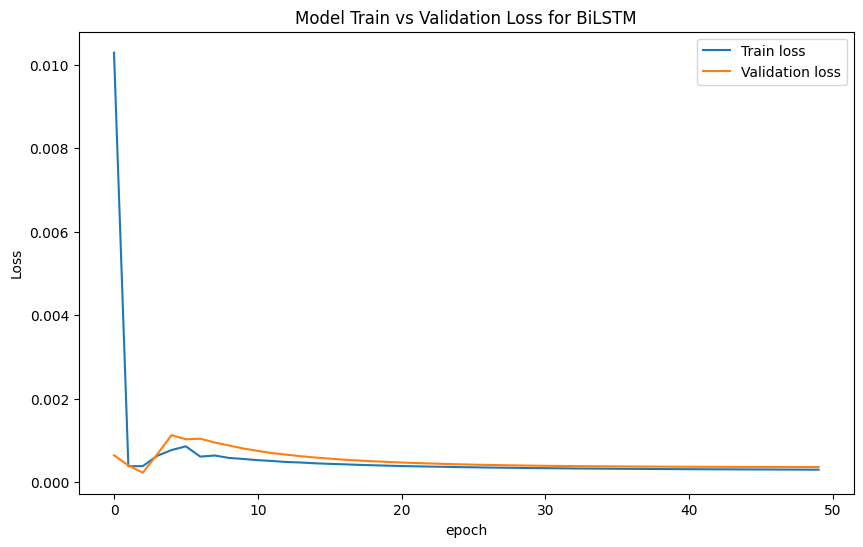

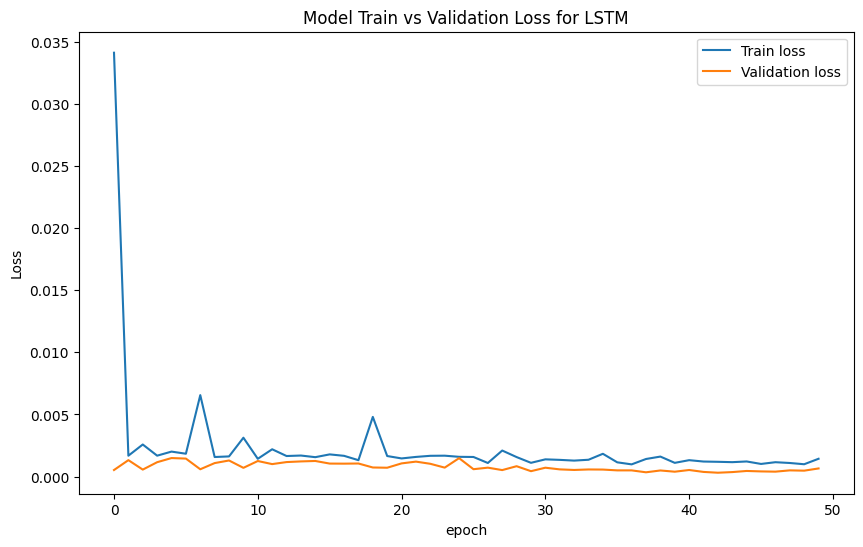

In [49]:
# Evaluating The Model
def plot_loss (history, model_name):
    plt.figure(figsize = (10, 6))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Train vs Validation Loss for ' + model_name)
    plt.ylabel('Loss')
    plt.xlabel('epoch')
    plt.legend(['Train loss', 'Validation loss'], loc='upper right')
 
plot_loss (history_gru, 'GRU')
plot_loss (history_bilstm, 'BiLSTM')
plot_loss (history_lstm, 'LSTM')

In [50]:
df

,Value
2020-02-01 00:00:00,18.7825
2020-02-01 01:00:00,18.8050
2020-02-01 02:00:00,18.7875
2020-02-01 03:00:00,18.7600
2020-02-01 04:00:00,18.7375
...,...
2023-02-03 19:00:00,19.1625
2023-02-03 20:00:00,19.1250
2023-02-03 21:00:00,19.0650
2023-02-03 22:00:00,19.0300


In [51]:
# We will concatenate the dataset and then scale them, as the last 1 data needs to be from training set
dataset_total = df['Value']
inputs = dataset_total[len(dataset_total) - len(testing_set) - 1:].values
inputs = inputs.reshape(-1,1) # reshape(-1,1) means one column with all rows
inputs = sc.transform(inputs)

X_test = []
for i in range(1, test_size+1): # 1+5276(test size)
    X_test.append(inputs[i-1:i, 0])

X_test = np.array(X_test)
# 3D format for LSTM
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [52]:
inputs.shape

(5277, 1)

In [53]:
X_test.shape

(5276, 1, 1)

In [54]:
#preict the model
# Make prediction
def prediction(model):
    prediction = model.predict(X_test)
    prediction = sc.inverse_transform(prediction)
    return prediction
prediction_gru = prediction(model_gru)
prediction_bilstm = prediction(model_bilstm)
prediction_lstm = prediction(model_lstm)


165/165 [==============================] - 1s 2ms/step


In [55]:
# Inverse the scaling
#predicted_gage_height = sc.inverse_transform(predicted_gage_height)

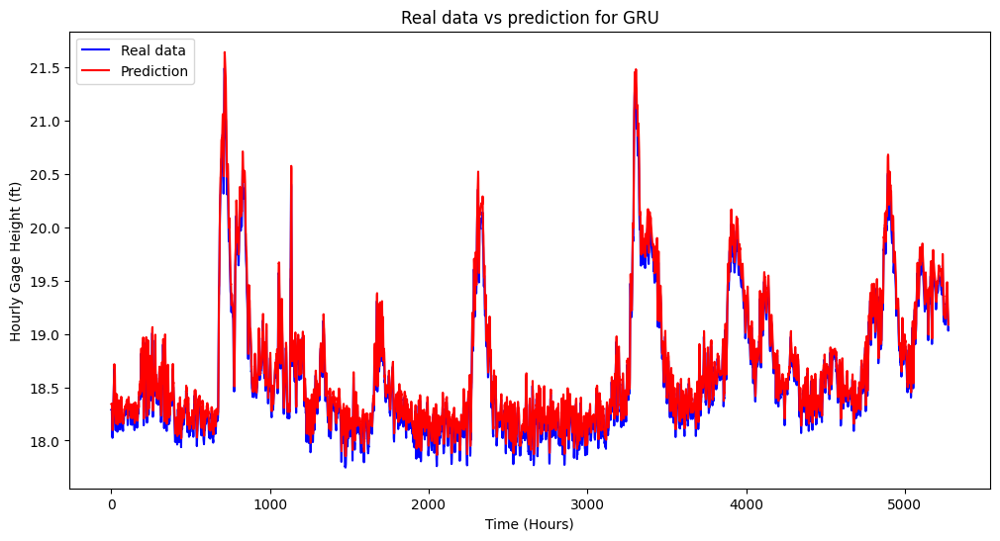

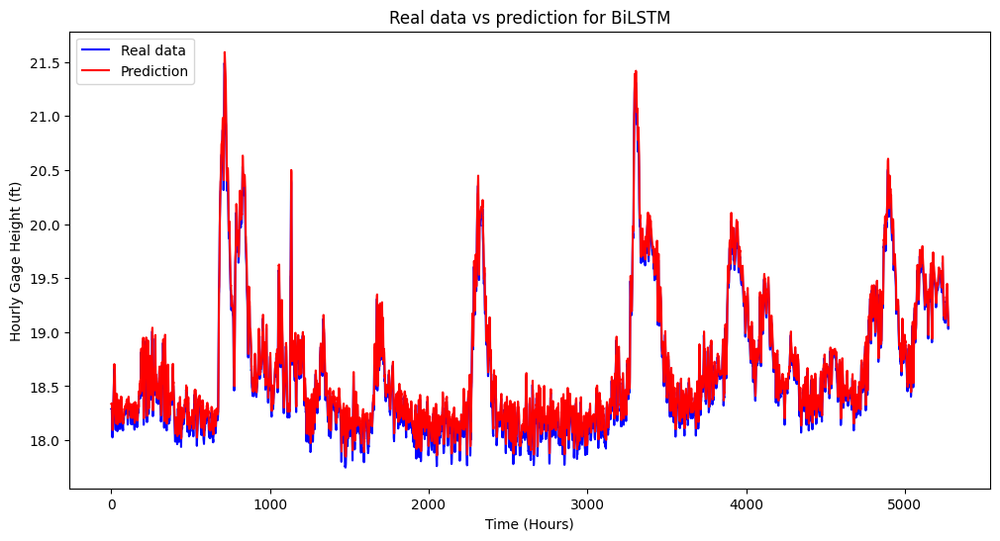

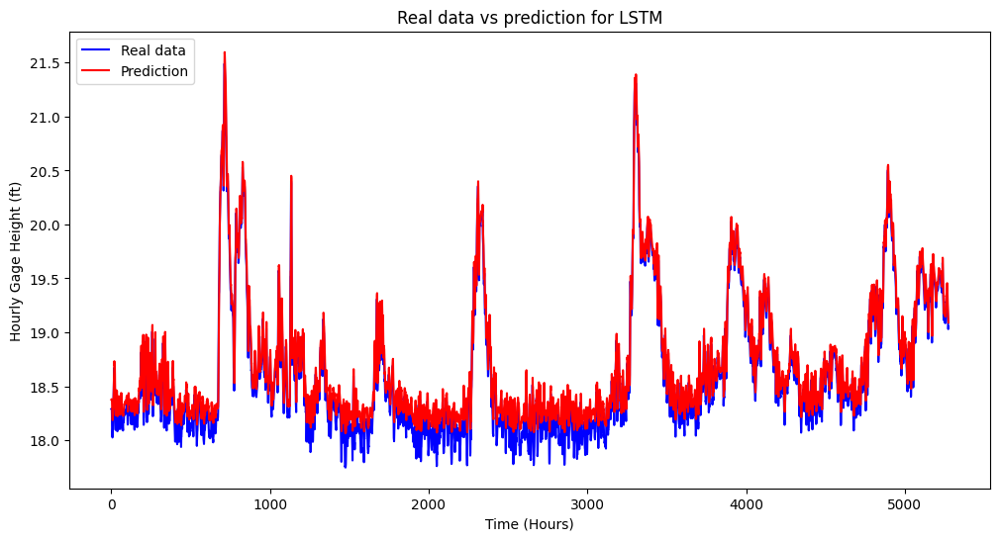

In [56]:
# Plot test data vs prediction
# Prediction is on top of real data
def plot_future(prediction, model_name, y_test):
    plt.figure(figsize=(12, 6))
    range_future = len(prediction)

    plt.plot(np.arange(range_future), np.array(y_test), 
             label='Real data', color='b')
    plt.plot(np.arange(range_future), 
             np.array(prediction),label='Prediction',color='r')
    
    plt.title('Real data vs prediction for ' + model_name)
    plt.legend(loc='upper left')
    plt.xlabel('Time (Hours)')
    plt.ylabel('Hourly Gage Height (ft)')
 
plot_future(prediction_gru, 'GRU', testing_set)
plot_future(prediction_bilstm, 'BiLSTM', testing_set)
plot_future(prediction_lstm, 'LSTM', testing_set)

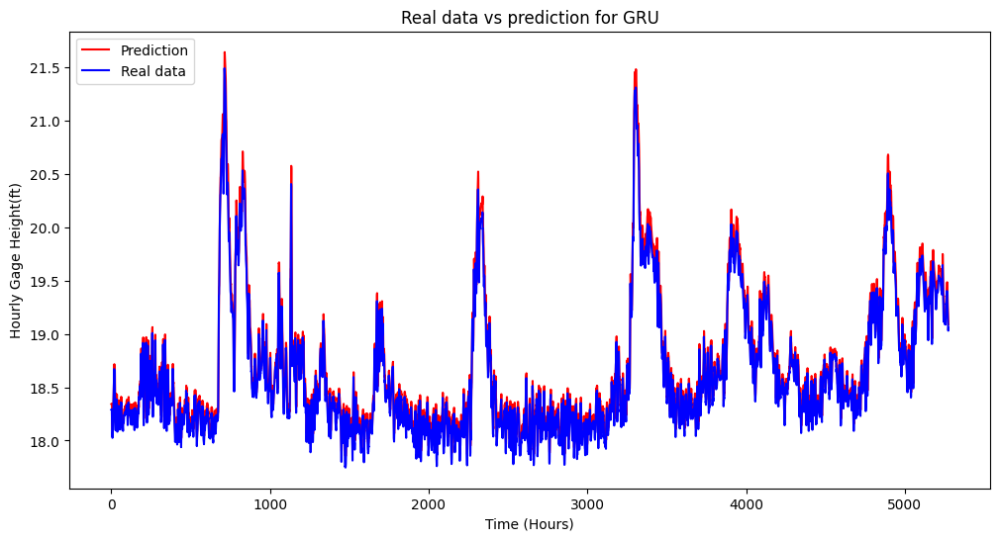

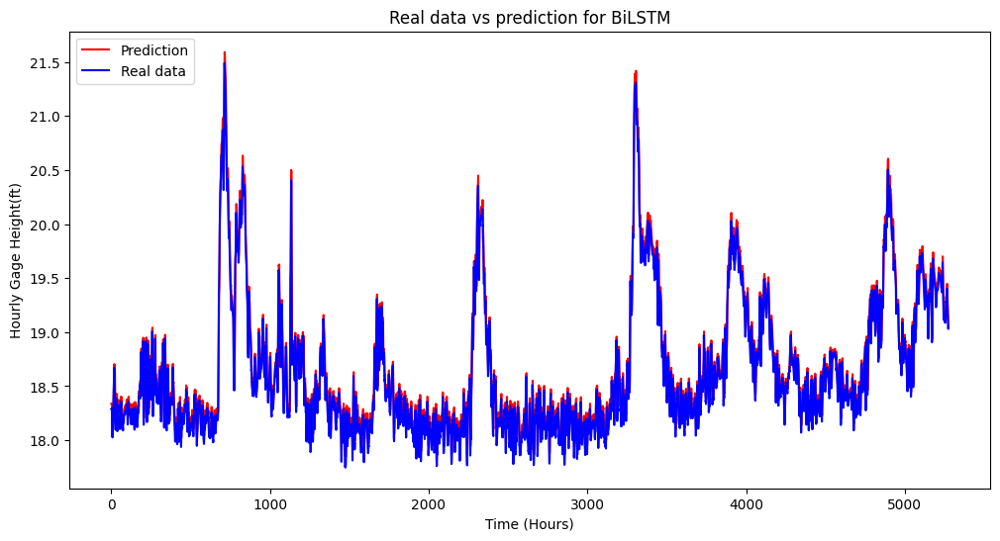

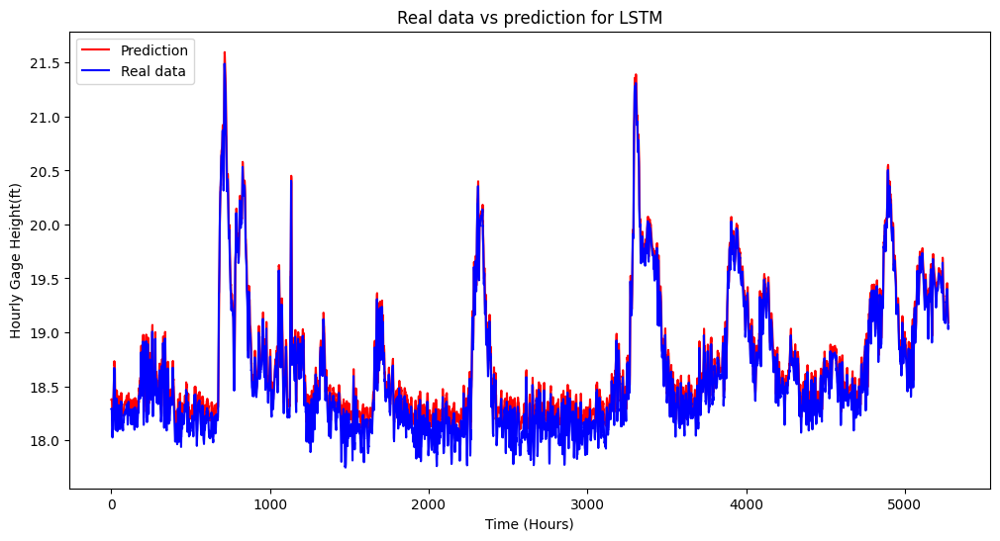

In [57]:
# Plot test data vs prediction
# Real data is on top of prediction
def plot_future(prediction, model_name, y_test):
    plt.figure(figsize=(12, 6))
    range_future = len(prediction)
    
    plt.plot(np.arange(range_future), 
             np.array(prediction),label='Prediction',color='r')
    
    plt.plot(np.arange(range_future), np.array(y_test), 
             label='Real data', color='b')
    
    plt.title('Real data vs prediction for ' + model_name)
    plt.legend(loc='upper left')
    plt.xlabel('Time (Hours)')
    plt.ylabel('Hourly Gage Height(ft)')
 
plot_future(prediction_gru, 'GRU', testing_set)
plot_future(prediction_bilstm, 'BiLSTM', testing_set)
plot_future(prediction_lstm, 'LSTM', testing_set)

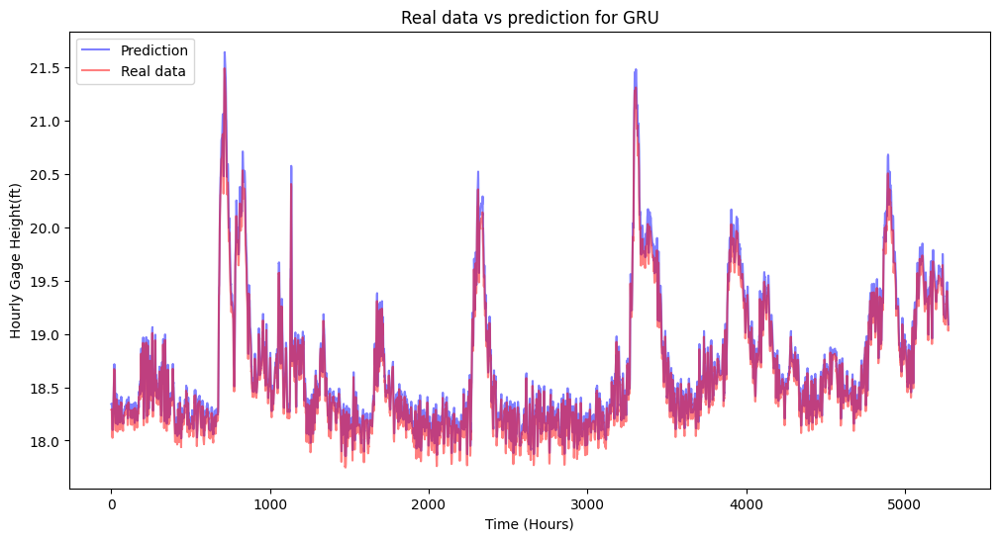

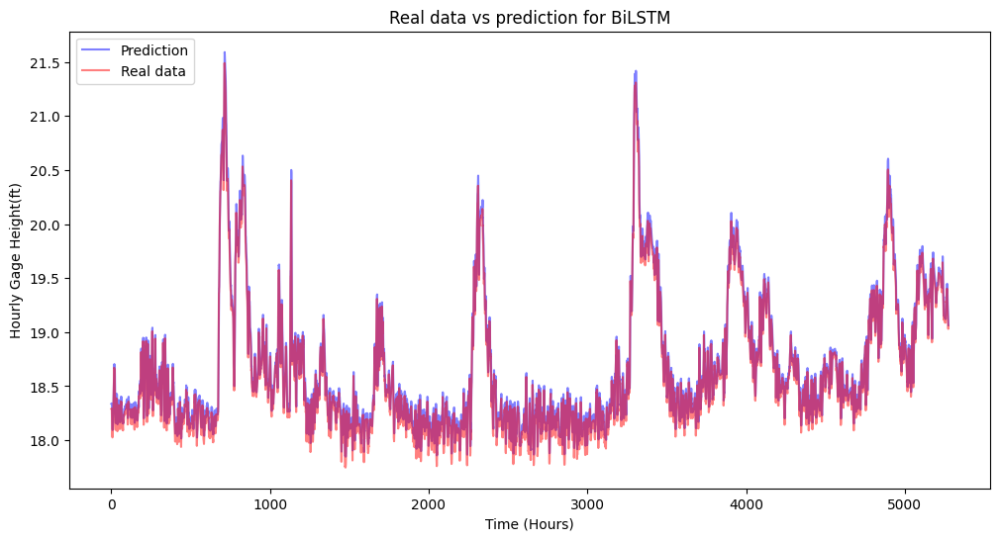

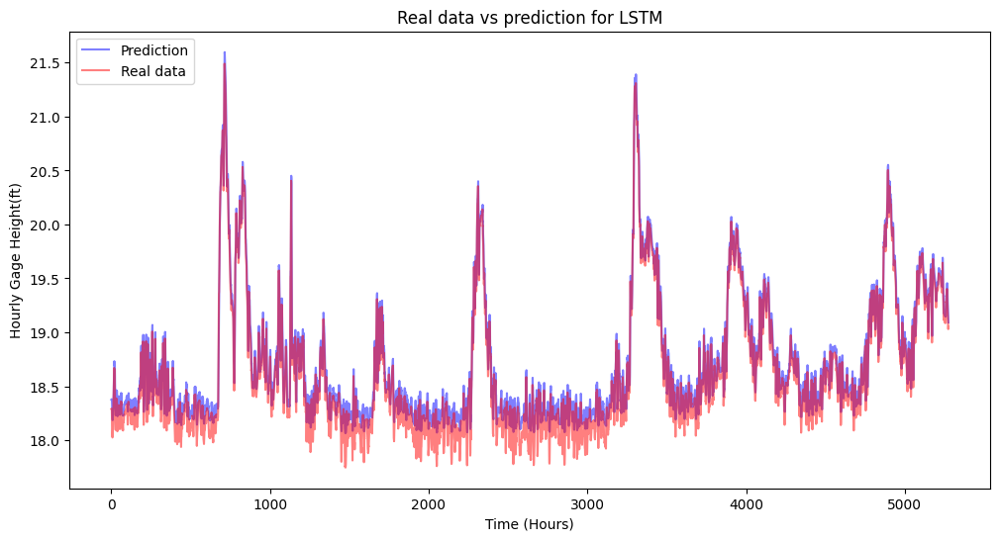

In [58]:
# Plot test data vs prediction
# changing opacity to see the overlapping
def plot_future(prediction, model_name, y_test):
    plt.figure(figsize=(12, 6))
    range_future = len(prediction)
    
    plt.plot(np.arange(range_future), 
             np.array(prediction),label='Prediction',color='b', alpha=0.5)
    
    plt.plot(np.arange(range_future), np.array(y_test), 
             label='Real data', color='r', alpha=0.5)
    
    plt.title('Real data vs prediction for ' + model_name)
    plt.legend(loc='upper left')
    plt.xlabel('Time (Hours)')
    plt.ylabel('Hourly Gage Height(ft)')
 
plot_future(prediction_gru, 'GRU', testing_set)
plot_future(prediction_bilstm, 'BiLSTM', testing_set)
plot_future(prediction_lstm, 'LSTM', testing_set)

In [59]:
from sklearn.metrics import mean_squared_error
error = mean_squared_error(testing_set, prediction_gru)
print(f'GRU MSE Error: {error}')

from statsmodels.tools.eval_measures import rmse
error = rmse(testing_set, prediction_gru)
print(f'GRU RMSE Error: {error}')

from sklearn.metrics import mean_absolute_percentage_error
error = mean_absolute_percentage_error(testing_set, prediction_gru)
print(f'GRU MAPE Error: {error}')

GRU MSE Error: 0.01020726573617466
GRU RMSE Error: [0.10103101]
GRU MAPE Error: 0.004341522995929725


In [60]:

error = mean_squared_error(testing_set, prediction_bilstm)
print(f'BiLSTM MSE Error: {error}')


error = rmse(testing_set, prediction_bilstm)
print(f'BiLSTM RMSE Error: {error}')

error = mean_absolute_percentage_error(testing_set, prediction_bilstm)
print(f'BiLSTM MAPE Error: {error}')

BiLSTM MSE Error: 0.007877683325756335
BiLSTM RMSE Error: [0.08875631]
BiLSTM MAPE Error: 0.0037860852511148193


In [61]:

error = mean_squared_error(testing_set, prediction_lstm)
print(f'LSTM MSE Error: {error}')


error = rmse(testing_set, prediction_lstm)
print(f'LSTM RMSE Error: {error}')

error = mean_absolute_percentage_error(testing_set, prediction_lstm)
print(f'LSTM MAPE Error: {error}')

LSTM MSE Error: 0.014537088329297966
LSTM RMSE Error: [0.12056985]
LSTM MAPE Error: 0.005469205853457454


In [62]:
from sklearn.metrics import r2_score

GRU_r2 = r2_score(testing_set, prediction_gru)
print(f'R2 score of GRU: {GRU_r2}')

BiLSTM_r2 = r2_score(testing_set, prediction_bilstm)
print(f'R2 score of BiLSTM: {BiLSTM_r2}')

LSTM_r2 = r2_score(testing_set, prediction_lstm)
print(f'R2 score of LSTM: {LSTM_r2}')

R2 score of GRU: 0.9731597757071325
R2 score of BiLSTM: 0.9792854626462657
R2 score of LSTM: 0.961774414284054
